# 03.7 - Sparse excitation (hBN) - organized regularization sweep

Reworked version of `03.6 - sparce excitation hbn.ipynb`. Same base/excited hBN phase
pair and the same checkerboard-multiplexed ptychography reconstruction, but organized
around three additions:

1. **A proper 2D grid sweep** over `tv_channel_diff` (TV on the differential/excitation
   channel) x sparsity weight, with the reconstructed excitation maps kept as real
   subplot grids -- once with a single shared (zero-centered) colorbar across the whole
   grid, and once with each subplot individually zero-centered/normalized.
2. **Grouped sparsity**: a new regularizer added to `ObjectMultiplexed`
   (`quantem/src/quantem/diffractive_imaging/object_models.py`) that pools the
   differential channel into `block_size x block_size` blocks, takes the L2 norm of each
   block, and applies an L1 (sparsity) penalty over those block norms -- i.e. group
   lasso. Unlike the existing pixelwise `channel_diff_sparcity`, this should encourage
   whole *blocks* of the excitation map to vanish rather than scattered single pixels.
   It's purely additive: new constraint keys default to `0.0`/off, so
   `03.6` and everything else keeps working unchanged.
3. **Disk-correlation "hot" maps**: the trick from `DIP part 2 - multi wavelengths.ipynb`
   (correlate the raw excitation-difference image with a disk roughly the
   inter-atomic spacing, `|correlate2d(diff, disk)|`) applied to the sweep outputs above,
   plus a couple of lower doses than the original notebook explored, to see how far
   the disk trick lets us push into noise.

Nothing in `03.6` is modified; this is a new notebook. The only source-code change is the
additive `channel_diff_group_sparcity` constraint mentioned above.


## Setup

In [1]:

import pickle
import time
import itertools

import numpy as np
import torch
from scipy import signal
from scipy.ndimage import zoom
from matplotlib import pyplot as plt

from stem_utils import generate_datacube

from quantem.core.datastructures import Dataset4dstem
from quantem.diffractive_imaging.dataset_models import PtychographyDatasetRaster
from quantem.diffractive_imaging.detector_models import DetectorPixelated
from quantem.diffractive_imaging.object_models import ObjectMultiplexed
from quantem.diffractive_imaging.probe_models import ProbePixelated
from quantem.diffractive_imaging.ptychography import Ptychography
from quantem.core.utils.diffractive_imaging_utils import fit_probe_circle

RESULTS_DIR = "sparse_excitation_sweep_results"
import os
os.makedirs(RESULTS_DIR, exist_ok=True)


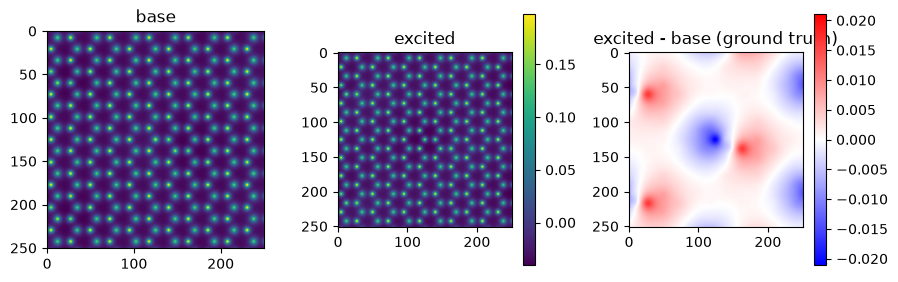

In [2]:

with open('bcenters_base_excited_phases_wide_fov.pkl', 'rb') as f:
    data = pickle.load(f)

base_phase = data['base']
excited_phase = data['excited']
x = data['x']
y = data['y']

dx = x[1] - x[0]
dy = y[1] - y[0]

plt.figure(figsize=(9, 3))
plt.subplot(1, 3, 1)
plt.imshow(base_phase)
plt.title('base')
plt.subplot(1, 3, 2)
plt.imshow(excited_phase)
plt.title('excited')
plt.colorbar()
plt.subplot(1, 3, 3)
diff_extent = np.max(np.abs(excited_phase - base_phase))
plt.imshow(excited_phase - base_phase, cmap='bwr', vmin=-diff_extent, vmax=diff_extent)
plt.title('excited - base (ground truth)')
plt.colorbar()
plt.tight_layout()
plt.show()


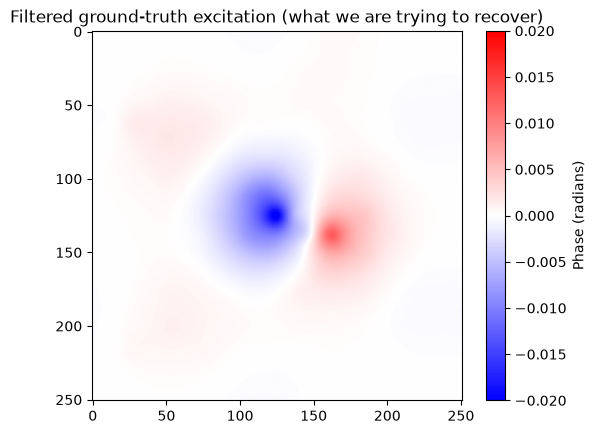

In [3]:

# same Hamming-windowed excitation used in 03.6, to taper the diff to zero at the FOV edges
window_y = np.hamming(base_phase.shape[0])
window_x = np.hamming(base_phase.shape[1])
hamming_filter = np.outer(window_y, window_x)

diff_phase = excited_phase - base_phase
filtered_diff_phase = diff_phase * hamming_filter
excited_phase = base_phase + filtered_diff_phase

plt.imshow(filtered_diff_phase, cmap='bwr', vmin=-0.02, vmax=0.02)
plt.colorbar(label='Phase (radians)')
plt.title('Filtered ground-truth excitation (what we are trying to recover)')
plt.show()


In [4]:

ACC_VOLTAGE     = 60e3   # eV
PROBE_SEMIANGLE = 20     # mrad
PROBE_DEFOCUS   = 30     # A
SCAN_STEP_SIZE  = 0.15   # A


def generate_merged_scan(im1, im2, x=x, y=y, dose=None, dp_trim=40, normalize=True):
    '''Simulate base/excited 4D-STEM datacubes and checkerboard-multiplex them,
    exactly as in 03.6 (dp_trim default changed to match the doses used below).'''
    meas1 = generate_datacube(
        im1, x, y,
        acc_voltage=ACC_VOLTAGE, probe_semiangle=PROBE_SEMIANGLE,
        probe_defocus=PROBE_DEFOCUS, scan_step_size=SCAN_STEP_SIZE,
    )
    meas2 = generate_datacube(
        im2, x, y,
        acc_voltage=ACC_VOLTAGE, probe_semiangle=PROBE_SEMIANGLE,
        probe_defocus=PROBE_DEFOCUS, scan_step_size=SCAN_STEP_SIZE,
    )

    if dose is not None:
        meas1 = meas1.poisson_noise(dose)
        meas2 = meas2.poisson_noise(dose)

    dcube1 = np.array(meas1.array)[:, :, dp_trim:-dp_trim, dp_trim:-dp_trim]
    dcube2 = np.array(meas2.array)[:, :, dp_trim:-dp_trim, dp_trim:-dp_trim]

    scan_mask = np.zeros(dcube2.shape[:2], dtype=np.uint8)
    xi = np.arange(scan_mask.shape[0])
    yi = np.arange(scan_mask.shape[1])
    for i in xi:
        for j in yi:
            if (i + j) % 2 == 0:
                scan_mask[i, j] = 1

    merged_scan = np.array(dcube1)
    merged_scan[scan_mask == 1, :, :] = np.array(dcube2)[scan_mask == 1, :, :]

    if normalize:
        s = merged_scan.sum(axis=(2, 3), keepdims=True)
        merged_scan = merged_scan / s

    return merged_scan.astype(np.float32), scan_mask


## Reconstruction wrapper

Same as `mixed_obj_ptycho_wrapper` in `03.6`, with two additions:
- `group_sparcity` / `group_block` kwargs wired to the new `channel_diff_group_sparcity`
  constraint (see the object-model change described above).
- `plot=False` fast path that skips the loss-curve/preview figures, since the sweeps
  below produce their own summary grids -- keeps a 16-run sweep from dumping 32 extra
  throwaway figures into the notebook.

In [5]:

def mixed_obj_ptycho_wrapper(
    dcube,
    scan_mask,
    obj_lr=5e-3,
    probe_lr=1e-5,
    tv_weight=0.0,
    tv_channel_diff=0.0,
    channel_diff_sparcity=0.0,
    group_sparcity=0.0,
    group_block=4,
    num_iters=100,
    batch_size=2**12,
    obj_padding=64,
    plot=False,
    return_extra=False,
):
    opt_params = {
        "object": {"type": "adam", "lr": obj_lr},
        "probe": {"type": "adam", "lr": probe_lr},
    }
    scheduler_params = {
        "object": {"type": "plateau"},
        "probe": {"type": "plateau"},
    }
    constraints = {
        "object": {
            "tv_weight_xy": tv_weight,
            "tv_channel_diff": tv_channel_diff,
            "channel_diff_sparcity": channel_diff_sparcity,
            "channel_diff_group_sparcity": group_sparcity,
            "channel_diff_group_sparcity_block_size": group_block,
            "fix_potential_baseline": False,
            "identical_slices": True,
            "apply_fov_mask": False,
        },
        "probe": {
            "center_probe": False,
            "orthogonalize_probe": True,
        },
        "dataset": {
            "descan_tv_weight": 0,
            "descan_shifts_constant": False,
        },
    }

    dset = Dataset4dstem.from_array(
        dcube, name='merged_scan',
        sampling=(SCAN_STEP_SIZE, SCAN_STEP_SIZE, 1, 1),
        units=("A", "A", "pixels", "pixels"),
    )
    probe_qy0, probe_qx0, probe_R = fit_probe_circle(dset.dp_mean.array, show=False)
    dset.sampling[2] = PROBE_SEMIANGLE / probe_R
    dset.sampling[3] = PROBE_SEMIANGLE / probe_R
    dset.units[2:] = ["mrad", "mrad"]

    pdset = PtychographyDatasetRaster.from_dataset4dstem(dset)
    pdset.preprocess(
        com_fit_function="constant", plot_rotation=False, plot_com=False,
        probe_energy=ACC_VOLTAGE, force_com_rotation=0, force_com_transpose=False,
    )

    probe_params = {"energy": ACC_VOLTAGE, "defocus": PROBE_DEFOCUS, "semiangle_cutoff": PROBE_SEMIANGLE}
    detector_model = DetectorPixelated()
    probe_model = ProbePixelated.from_params(num_probes=1, probe_params=probe_params)
    obj_model = ObjectMultiplexed.from_uniform(
        num_slices=1, slice_thicknesses=1, obj_type='pure_phase',
        num_channels=2, patches_mask=torch.tensor(scan_mask),
    )
    ptycho = Ptychography.from_models(
        dset=pdset, obj_model=obj_model, probe_model=probe_model,
        detector_model=detector_model, device='cuda',
    )
    ptycho.preprocess(obj_padding_px=(obj_padding, obj_padding), batch_size=batch_size)
    ptycho.reconstruct(
        num_iters=num_iters, reset=True, autograd=True, device='cuda',
        constraints=constraints, optimizer_params=opt_params,
        scheduler_params=scheduler_params, batch_size=batch_size,
        multichannel_mode=True,
    )

    recon_off = np.angle(
        ptycho.obj_model.obj[0, 0, obj_padding:-obj_padding, obj_padding:-obj_padding]
        .detach().cpu().numpy()
    )
    recon_on = np.angle(
        ptycho.obj_model.obj[1, 0, obj_padding:-obj_padding, obj_padding:-obj_padding]
        .detach().cpu().numpy()
    )

    if plot:
        ptycho.plot_losses()
        diff = recon_on - recon_off
        diff_extent = np.max(np.abs(diff))
        plt.figure()
        plt.subplot(2, 1, 1)
        plt.imshow(recon_off, cmap='gray')
        plt.colorbar()
        plt.subplot(2, 1, 2)
        plt.imshow(diff, cmap='seismic', vmin=-diff_extent, vmax=diff_extent)
        plt.colorbar()
        plt.show()

    if return_extra:
        return recon_off, recon_on, ptycho
    return recon_off, recon_on


## Plotting helpers

`plot_regularization_grid` lays subplots out as rows x cols over the two regularizer
axes, always zero-centered (`cmap='seismic'`, `vmin=-v`, `vmax=v`) as in every diff plot
in `03.6`, either with one shared `v` for the whole grid (`shared_cbar=True`) or one `v`
per subplot (`shared_cbar=False`).

`disk_kernel` / `hot_correlation` reproduce the blob-detection trick from
*DIP part 2 - multi wavelengths.ipynb*: correlate the raw (unfiltered) excitation
difference with a filled disk about the size of the inter-atomic spacing (or larger),
which averages away pixel-scale noise while keeping spatially-extended real signal.

In [6]:

def plot_regularization_grid(
    results, row_vals, col_vals, row_label, col_label,
    shared_cbar=True, cmap='seismic', suptitle=None,
    cell_size=2.5, dpi=110, savepath=None,
):
    n_rows, n_cols = len(row_vals), len(col_vals)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(cell_size * n_cols + 1.0, cell_size * n_rows + 0.8),
        squeeze=False, dpi=dpi,
    )

    if shared_cbar:
        vmax = max(np.abs(results[(r, c)]).max() for r in row_vals for c in col_vals)

    last_im = None
    for i, r in enumerate(row_vals):
        for j, c in enumerate(col_vals):
            ax = axes[i, j]
            diff = results[(r, c)]
            local_vmax = vmax if shared_cbar else np.abs(diff).max()
            im = ax.imshow(diff, cmap=cmap, vmin=-local_vmax, vmax=local_vmax)
            last_im = im
            ax.set_xticks([])
            ax.set_yticks([])
            # per-cell titles/labels are just the value -- the full parameter names
            # (which can be long, e.g. "channel_diff_group_sparcity (block=4)") are
            # given once via supxlabel/supylabel below so they never overlap.
            if i == 0:
                ax.set_title(f"{c:g}", fontsize=11)
            if j == 0:
                ax.set_ylabel(f"{r:g}", fontsize=11)
            if not shared_cbar:
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    fig.supxlabel(col_label, fontsize=12)
    fig.supylabel(row_label, fontsize=12)

    if shared_cbar:
        fig.colorbar(last_im, ax=axes, fraction=0.025, pad=0.02, label='excitation phase (rad)')

    title = suptitle or f"{row_label} (rows) x {col_label} (cols) -- {'shared' if shared_cbar else 'individual'} colorbar"
    fig.suptitle(title, fontsize=13)

    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig


def disk_kernel(rad):
    ax = np.arange(rad * 2)
    axx, axy = np.meshgrid(ax, ax)
    return ((axy - rad) ** 2 + (axx - rad) ** 2 < rad ** 2).astype(float)


def hot_correlation(diff, rad=7):
    return np.abs(signal.correlate2d(diff, disk_kernel(rad), mode='same'))


def plot_dose_series(entries, rad=7, suptitle=None, savepath=None):
    '''entries: list of (label, diff_image) tuples, one column per dose.'''
    n = len(entries)
    fig, axes = plt.subplots(2, n, figsize=(3.4 * n, 6.6), dpi=110, squeeze=False)
    for j, (label, diff) in enumerate(entries):
        vmax = np.abs(diff).max()
        axes[0, j].imshow(diff, cmap='seismic', vmin=-vmax, vmax=vmax)
        axes[0, j].set_title(label, fontsize=11)
        axes[0, j].set_xticks([]); axes[0, j].set_yticks([])

        hot = hot_correlation(diff, rad=rad)
        axes[1, j].imshow(hot, cmap='hot')
        axes[1, j].set_xticks([]); axes[1, j].set_yticks([])

    if suptitle:
        fig.suptitle(suptitle, fontsize=13)

    axes[0, 0].set_ylabel('recon\n(on - off)', fontsize=10)
    axes[1, 0].set_ylabel(f'disk-corr\n(r={rad}px)', fontsize=10)
    fig.tight_layout(rect=[0, 0, 1, 0.94] if suptitle else None)
    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig


## Part 1 - dataset for the main sweep (dose = 1e5)

One noisy checkerboard-multiplexed datacube, generated once and reused across every
`(tv_channel_diff, sparsity)` combination below -- the datacube doesn't depend on the
regularization, only the reconstruction does.

tasks:   2%|1         | 2/123 [00:02<02:51,  1.42s/it]

tasks:   2%|1         | 2/123 [00:01<01:59,  1.01it/s]

scan generated in 97.5s, shape=(161, 161, 87, 87)


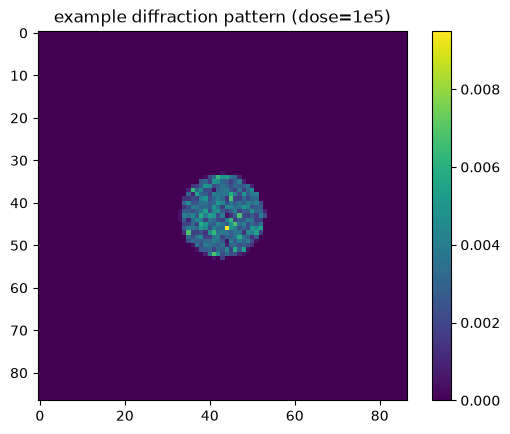

In [7]:

t0 = time.time()
scan_1e5, scan_mask_1e5 = generate_merged_scan(base_phase, excited_phase, dose=1e5, dp_trim=40)
print(f"scan generated in {time.time() - t0:.1f}s, shape={scan_1e5.shape}")

plt.imshow(scan_1e5[0, 0, ...])
plt.title('example diffraction pattern (dose=1e5)')
plt.colorbar()
plt.show()


### 1a. L1 sparsity x TV grid

The regularizer already in `03.6`: `channel_diff_sparcity` is a plain L1 penalty
(`mean(|diff_phase|)`) on the excited-minus-base phase channel, combined here with
`tv_channel_diff` (TV on that same differential channel).

In [8]:

TV_VALUES = [0.0, 25.0, 100.0, 300.0]
L1_SPARSITY_VALUES = [0.0, 5.0, 20.0, 60.0]

l1_results = {}
l1_timings = {}
for tv, sp in itertools.product(TV_VALUES, L1_SPARSITY_VALUES):
    t0 = time.time()
    recon_off, recon_on = mixed_obj_ptycho_wrapper(
        scan_1e5, scan_mask_1e5,
        tv_channel_diff=tv, channel_diff_sparcity=sp,
        num_iters=100, obj_lr=5e-3, batch_size=2**12, obj_padding=64,
    )
    dt = time.time() - t0
    l1_results[(tv, sp)] = recon_on - recon_off
    l1_timings[(tv, sp)] = dt
    print(f"tv_channel_diff={tv:g}  channel_diff_sparcity={sp:g}  ({dt:.1f}s)")

with open(f"{RESULTS_DIR}/l1_grid_dose1e5.pkl", "wb") as f:
    pickle.dump({"results": l1_results, "tv": TV_VALUES, "sp": L1_SPARSITY_VALUES}, f)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

/workspace/quantem_light_enhanced/quantem/src/quantem/diffractive_imaging/object_models.py:1305: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at /__w/pytorch/pytorch/aten/src/ATen/native/Copy.cpp:307.)
  post_constraint_obj[ch] = self.apply_hard_constraints(


  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_sparcity=0  (45.6s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_sparcity=5  (44.7s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_sparcity=20  (44.8s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_sparcity=60  (44.9s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_sparcity=0  (45.3s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_sparcity=5  (46.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_sparcity=20  (46.1s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_sparcity=60  (45.9s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_sparcity=0  (45.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_sparcity=5  (46.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_sparcity=20  (46.1s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_sparcity=60  (46.2s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_sparcity=0  (44.9s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_sparcity=5  (45.2s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_sparcity=20  (44.9s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_sparcity=60  (46.0s)


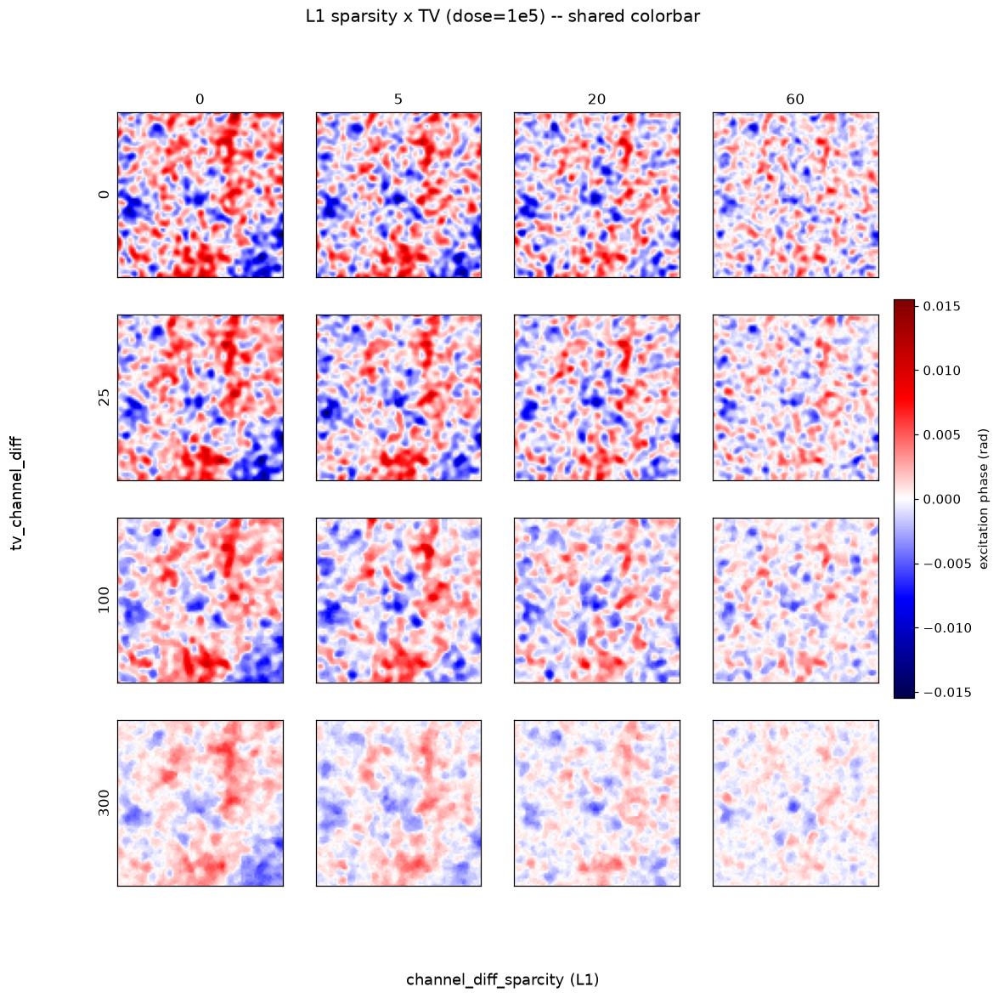

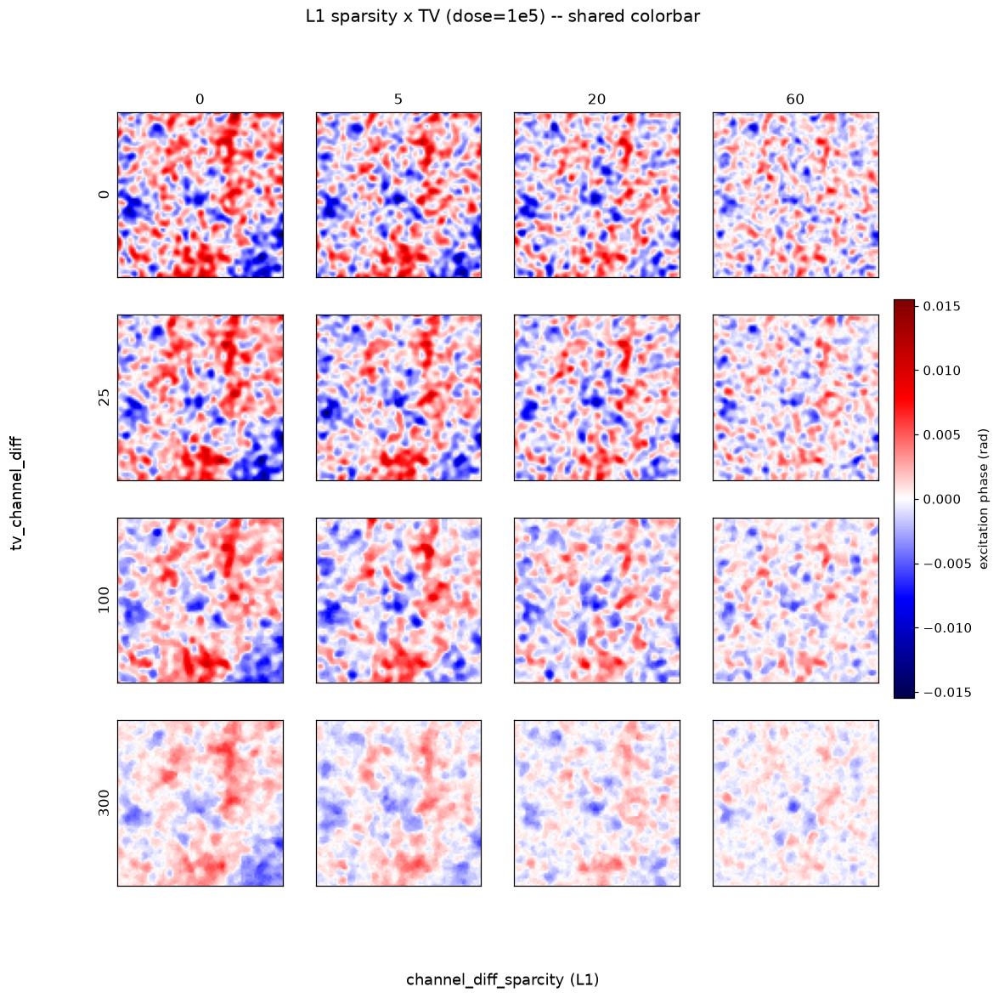

In [9]:

plot_regularization_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    shared_cbar=True,
    suptitle='L1 sparsity x TV (dose=1e5) -- shared colorbar',
    savepath=f"{RESULTS_DIR}/l1_grid_shared_cbar.png",
)


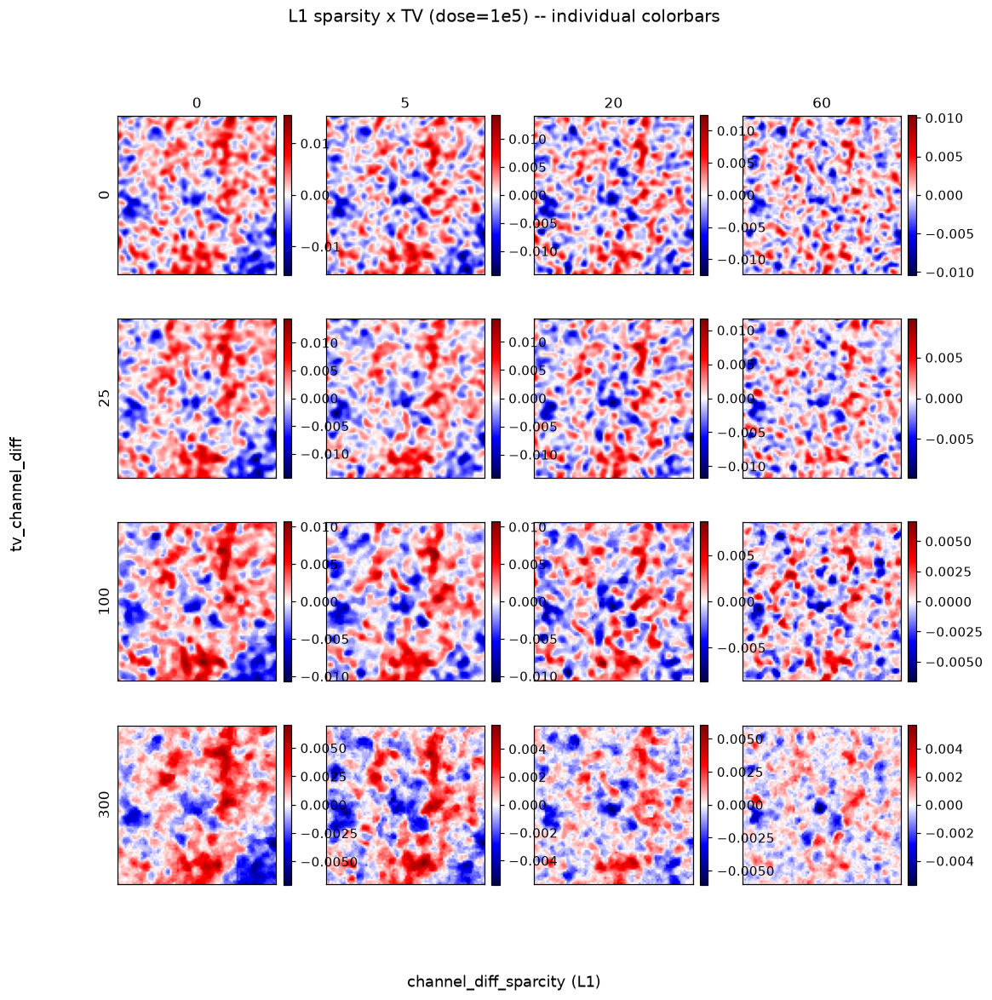

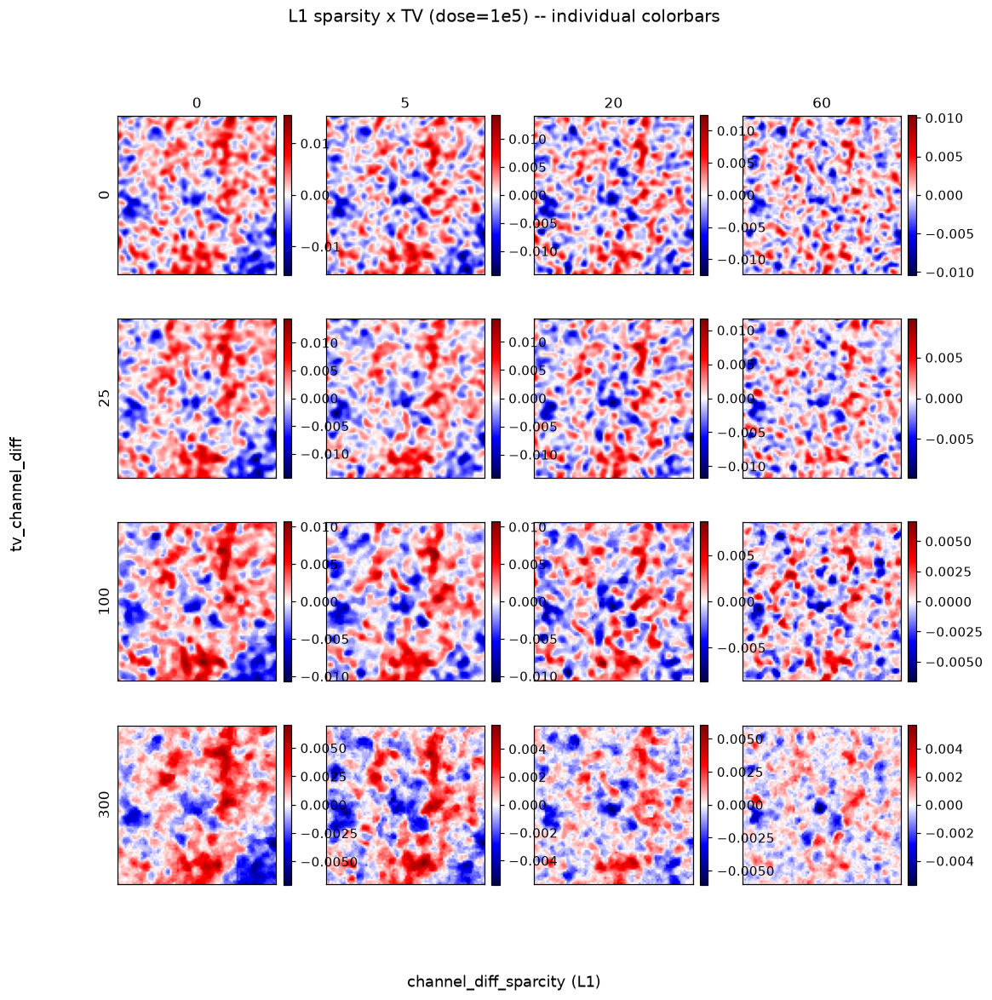

In [10]:

plot_regularization_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    shared_cbar=False,
    suptitle='L1 sparsity x TV (dose=1e5) -- individual colorbars',
    savepath=f"{RESULTS_DIR}/l1_grid_individual_cbar.png",
)


## Part 2 - grouped sparsity

`channel_diff_group_sparcity` pools the differential channel into non-overlapping
`block_size x block_size` blocks, takes the L2 norm of each block, and penalizes the
mean of those block norms (group lasso). The idea: rather than shrinking individual
noisy pixels toward zero (what plain L1 does), it should shrink or keep whole
neighborhoods together, which is closer to what "real" localized excitation actually
looks like.

First, a quick calibration at `tv_channel_diff=0` to find a sensible weight range for
this dataset -- the group-norm loss is on a different numerical scale than the plain-L1
loss, so the two aren't directly comparable weight-for-weight.

In [11]:

calib_weights = [0.0, 0.5, 1.0, 3.0, 10.0, 30.0, 100.0]
calib_rows = []
for w in calib_weights:
    t0 = time.time()
    recon_off, recon_on = mixed_obj_ptycho_wrapper(
        scan_1e5, scan_mask_1e5, group_sparcity=w, group_block=4, num_iters=40,
    )
    diff = recon_on - recon_off
    calib_rows.append((w, np.mean(np.abs(diff)), diff.std(), np.abs(diff).max(), time.time() - t0))
    print(f"group_sparcity={w:6g}  mean|diff|={calib_rows[-1][1]:.5f}  std={calib_rows[-1][2]:.5f}  max|diff|={calib_rows[-1][3]:.5f}  ({calib_rows[-1][4]:.1f}s)")


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=     0  mean|diff|=0.00345  std=0.00423  max|diff|=0.01602  (29.3s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=   0.5  mean|diff|=0.00331  std=0.00411  max|diff|=0.01506  (29.4s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=     1  mean|diff|=0.00310  std=0.00396  max|diff|=0.01844  (30.1s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=     3  mean|diff|=0.00288  std=0.00367  max|diff|=0.01359  (30.1s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=    10  mean|diff|=0.00244  std=0.00311  max|diff|=0.01279  (30.3s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=    30  mean|diff|=0.00165  std=0.00212  max|diff|=0.01058  (30.9s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/40 [00:00<?, ?it/s]

group_sparcity=   100  mean|diff|=0.00112  std=0.00142  max|diff|=0.00714  (30.2s)


*(Grid weights below were chosen after inspecting the calibration printout above, to span the same no-effect -> strongly-suppressed range that the L1 sweep covers.)*

In [12]:

GROUP_SPARSITY_VALUES = [0.0, 3.0, 15.0, 50.0]
GROUP_BLOCK_SIZE = 4

group_results = {}
group_timings = {}
for tv, gw in itertools.product(TV_VALUES, GROUP_SPARSITY_VALUES):
    t0 = time.time()
    recon_off, recon_on = mixed_obj_ptycho_wrapper(
        scan_1e5, scan_mask_1e5,
        tv_channel_diff=tv, group_sparcity=gw, group_block=GROUP_BLOCK_SIZE,
        num_iters=100, obj_lr=5e-3, batch_size=2**12, obj_padding=64,
    )
    dt = time.time() - t0
    group_results[(tv, gw)] = recon_on - recon_off
    group_timings[(tv, gw)] = dt
    print(f"tv_channel_diff={tv:g}  channel_diff_group_sparcity={gw:g}  ({dt:.1f}s)")

with open(f"{RESULTS_DIR}/group_grid_dose1e5.pkl", "wb") as f:
    pickle.dump({"results": group_results, "tv": TV_VALUES, "gw": GROUP_SPARSITY_VALUES, "block": GROUP_BLOCK_SIZE}, f)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_group_sparcity=0  (44.8s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_group_sparcity=3  (45.8s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_group_sparcity=15  (44.4s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=0  channel_diff_group_sparcity=50  (44.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_group_sparcity=0  (45.0s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_group_sparcity=3  (46.0s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_group_sparcity=15  (45.1s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=25  channel_diff_group_sparcity=50  (45.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_group_sparcity=0  (44.6s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_group_sparcity=3  (45.3s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_group_sparcity=15  (45.6s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=100  channel_diff_group_sparcity=50  (46.4s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_group_sparcity=0  (44.7s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_group_sparcity=3  (45.4s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_group_sparcity=15  (45.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

tv_channel_diff=300  channel_diff_group_sparcity=50  (45.6s)


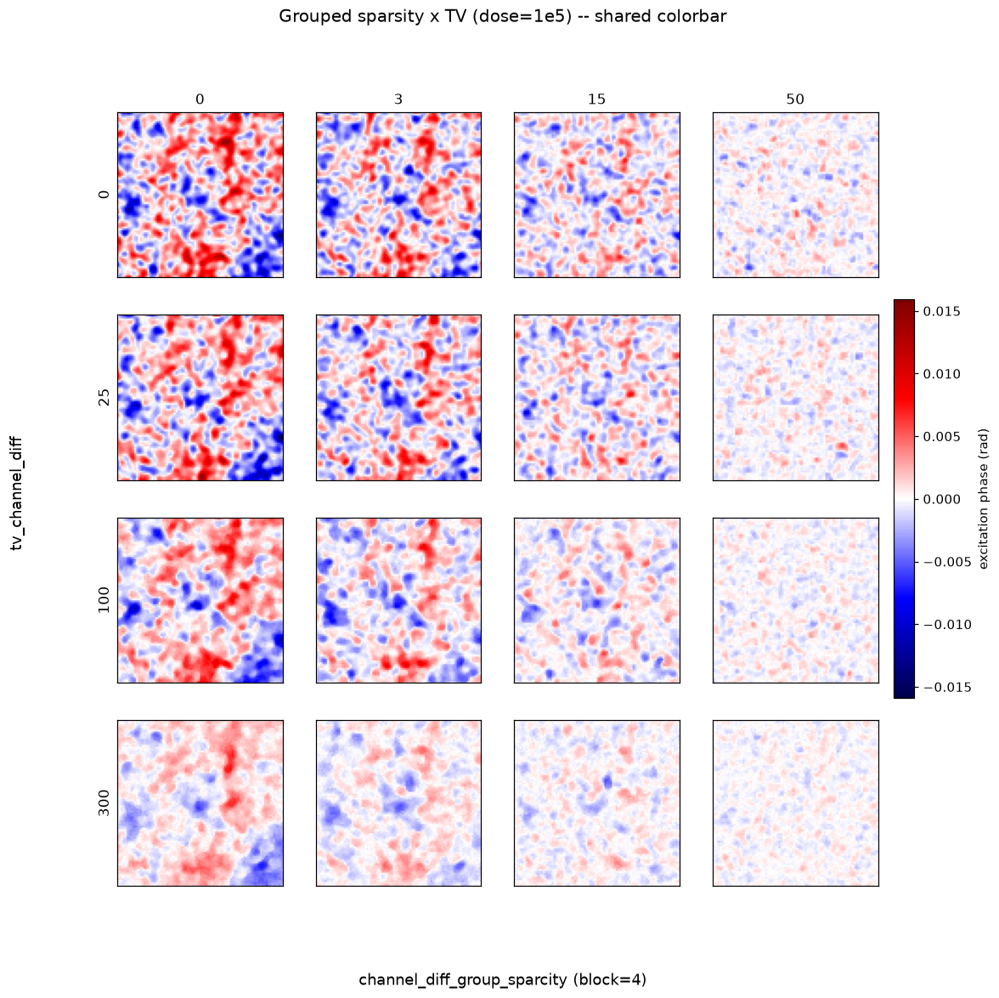

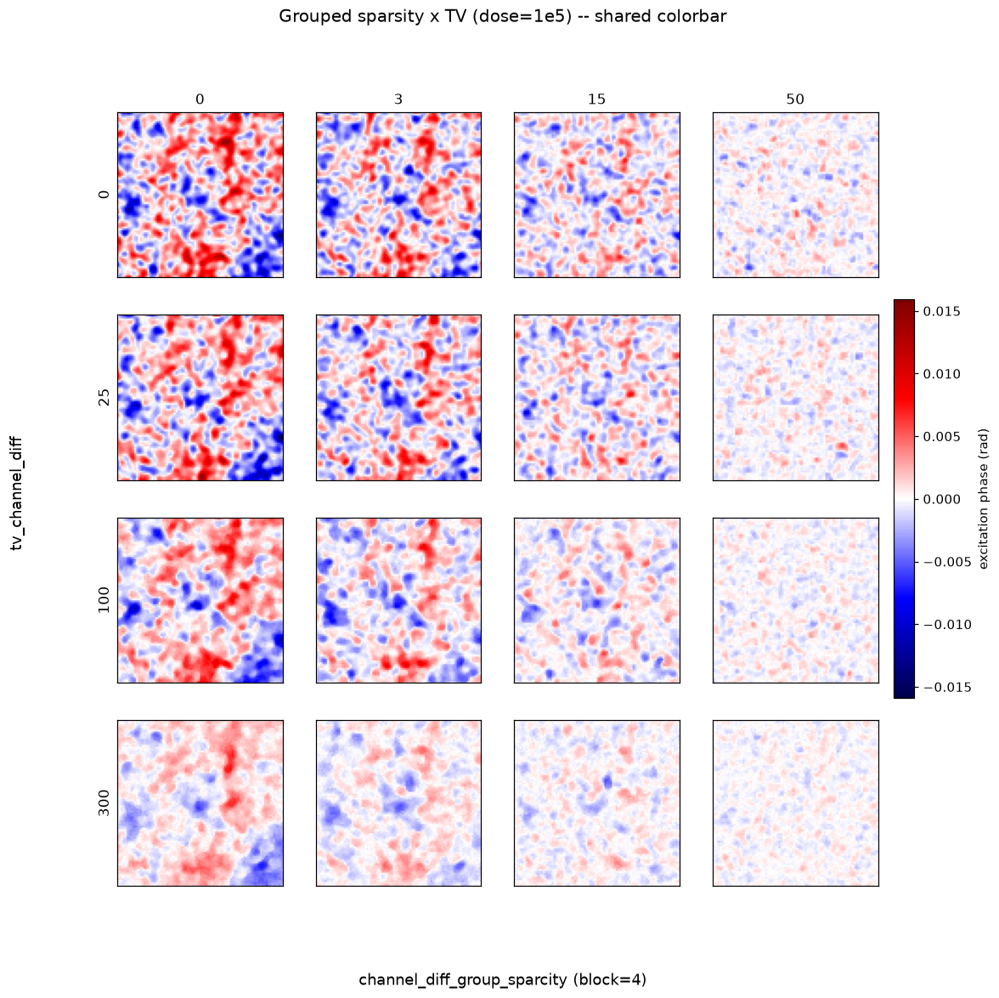

In [13]:

plot_regularization_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_group_sparcity (block=4)',
    shared_cbar=True,
    suptitle='Grouped sparsity x TV (dose=1e5) -- shared colorbar',
    savepath=f"{RESULTS_DIR}/group_grid_shared_cbar.png",
)


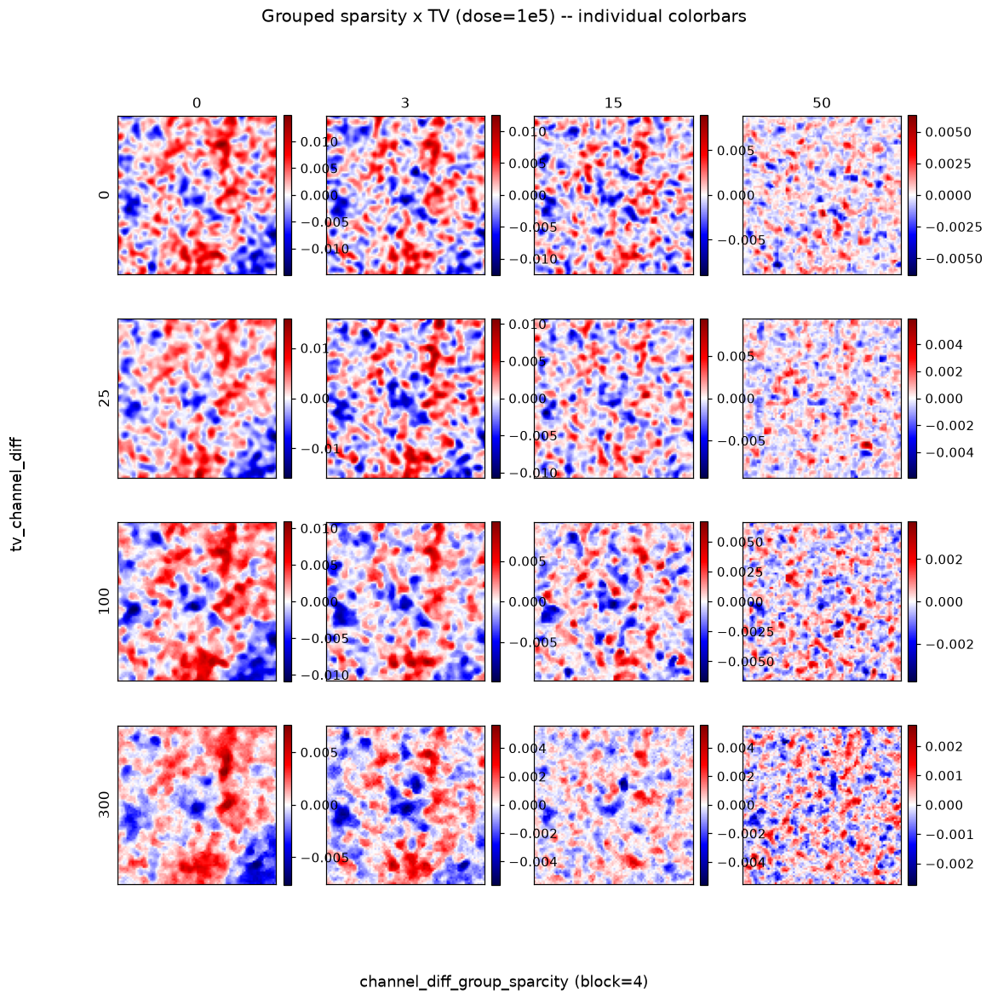

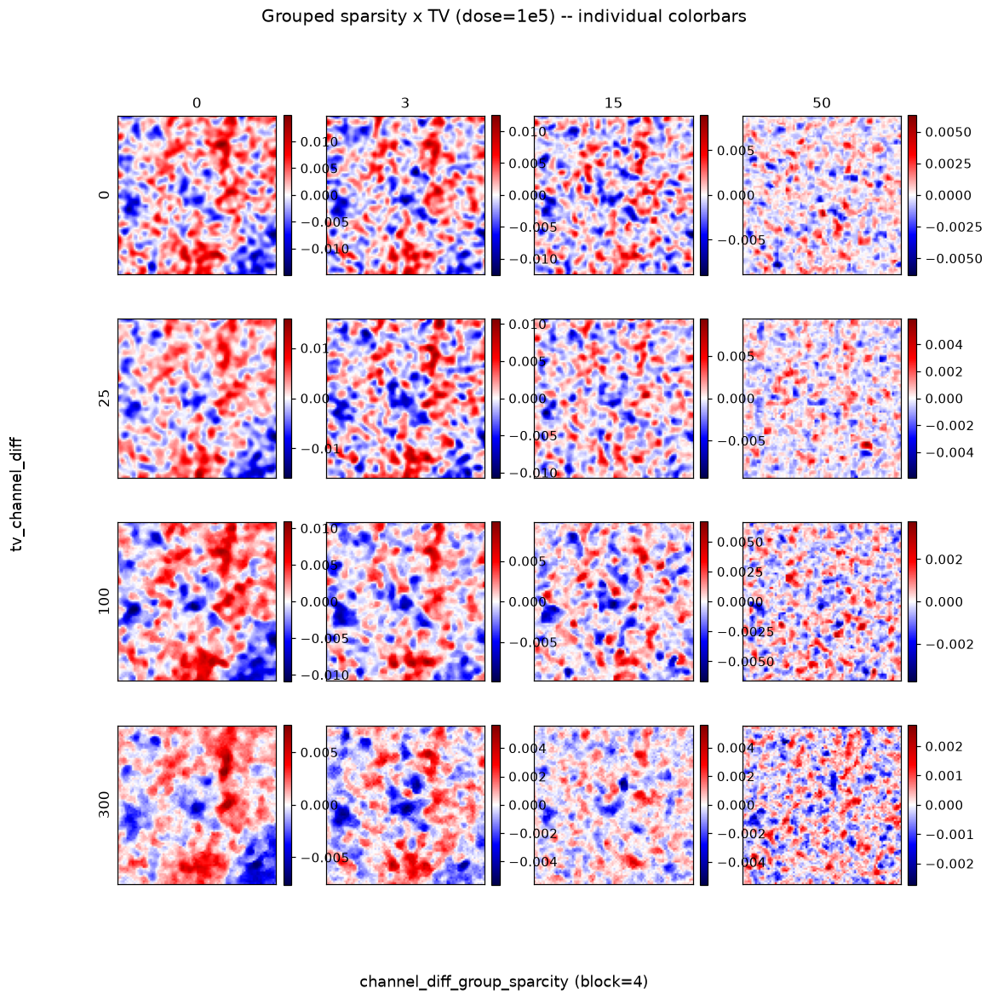

In [14]:

plot_regularization_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_group_sparcity (block=4)',
    shared_cbar=False,
    suptitle='Grouped sparsity x TV (dose=1e5) -- individual colorbars',
    savepath=f"{RESULTS_DIR}/group_grid_individual_cbar.png",
)


### 2a. Bonus: does the block size matter?

Quick 1D sweep of `block_size` at a fixed, moderate group-sparsity weight and
`tv_channel_diff=0`, to see whether the group size itself changes the character of the
result (bigger blocks -> coarser/blobbier suppression).

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

block_size=2  (44.8s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

block_size=4  (45.1s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

block_size=8  (45.5s)


Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/100 [00:00<?, ?it/s]

block_size=16  (44.6s)


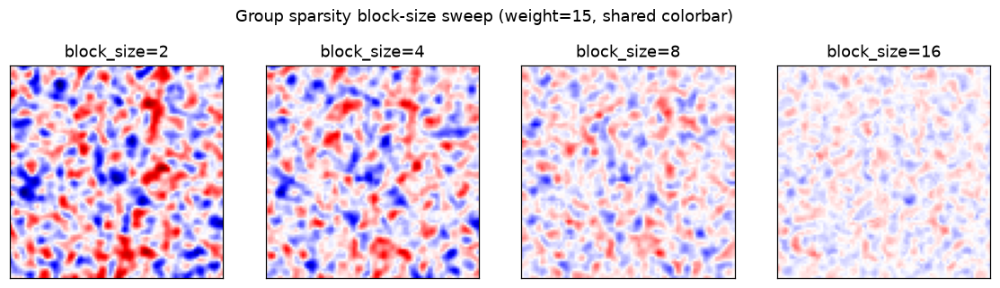

In [15]:

BLOCK_SIZES = [2, 4, 8, 16]
FIXED_GROUP_WEIGHT = 15.0

block_results = {}
for b in BLOCK_SIZES:
    t0 = time.time()
    recon_off, recon_on = mixed_obj_ptycho_wrapper(
        scan_1e5, scan_mask_1e5,
        group_sparcity=FIXED_GROUP_WEIGHT, group_block=b,
        num_iters=100, obj_lr=5e-3, batch_size=2**12, obj_padding=64,
    )
    block_results[b] = recon_on - recon_off
    print(f"block_size={b}  ({time.time() - t0:.1f}s)")

fig, axes = plt.subplots(1, len(BLOCK_SIZES), figsize=(3.2 * len(BLOCK_SIZES), 3.4), dpi=110)
vmax = max(np.abs(v).max() for v in block_results.values())
for ax, b in zip(axes, BLOCK_SIZES):
    ax.imshow(block_results[b], cmap='seismic', vmin=-vmax, vmax=vmax)
    ax.set_title(f"block_size={b}")
    ax.set_xticks([]); ax.set_yticks([])
fig.suptitle(f"Group sparsity block-size sweep (weight={FIXED_GROUP_WEIGHT:g}, shared colorbar)")
fig.savefig(f"{RESULTS_DIR}/group_block_size_sweep.png", bbox_inches='tight')
plt.show()


## Part 3 - disk-correlation "hot" maps, across doses

Reproducing the trick from *DIP part 2 - multi wavelengths.ipynb*: the raw
`recon_on - recon_off` difference is noisy pixel-to-pixel, but real excitation tends to
be spatially extended over roughly an inter-atomic distance or more, while shot noise
isn't. Correlating with a filled disk of about that radius averages out the former and
keeps the latter.

We reuse two picks from the Part 1 grid rather than just one: a **mild** one
(`tv_channel_diff=100, channel_diff_sparcity=20`, roughly the middle of the grid) and
the **strongest** one tested (`tv_channel_diff=300, channel_diff_sparcity=60`) --
neither exhaustively re-optimized per dose, feel free to swap in whichever grid cell
looked best above. Comparing the two across doses (including two doses lower than
anything swept in `03.6`) shows *why* the regularization search in Parts 1-2 matters:
it's not just cosmetic, it's the difference between the disk-correlation trick finding
real signal or finding nothing.

In [16]:

REG_PICKS = {
    'mild (tv=100, sp=20)': (100.0, 20.0),
    'strong (tv=300, sp=60)': (300.0, 60.0),
}

DOSES = {
    'noiseless': None,
    '1e5 (main sweep)': 1e5,
    '1e4': 1e4,
    '2e3': 2e3,
}

dose_diffs = {pick_label: {} for pick_label in REG_PICKS}
for pick_label, (tv, sp) in REG_PICKS.items():
    dose_diffs[pick_label]['1e5 (main sweep)'] = l1_results[(tv, sp)]

for pick_label, (tv, sp) in REG_PICKS.items():
    for label, dose in DOSES.items():
        if label in dose_diffs[pick_label]:
            continue
        t0 = time.time()
        scan_d, mask_d = generate_merged_scan(base_phase, excited_phase, dose=dose, dp_trim=40)
        recon_off, recon_on = mixed_obj_ptycho_wrapper(
            scan_d, mask_d,
            tv_channel_diff=tv, channel_diff_sparcity=sp,
            num_iters=150, obj_lr=5e-3, batch_size=2**12, obj_padding=64,
        )
        dose_diffs[pick_label][label] = recon_on - recon_off
        print(f"[{pick_label}] dose={label}  total time (scan+recon) = {time.time() - t0:.1f}s")

with open(f"{RESULTS_DIR}/dose_series_diffs.pkl", "wb") as f:
    pickle.dump({"dose_diffs": dose_diffs, "reg_picks": REG_PICKS}, f)


tasks:   2%|1         | 2/123 [00:01<01:49,  1.10it/s]

tasks:   2%|1         | 2/123 [00:01<01:52,  1.08it/s]

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/150 [00:00<?, ?it/s]

[mild (tv=100, sp=20)] dose=noiseless  total time (scan+recon) = 112.1s


tasks:   2%|1         | 2/123 [00:01<01:47,  1.13it/s]

tasks:   2%|1         | 2/123 [00:01<01:49,  1.10it/s]

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/150 [00:00<?, ?it/s]

[mild (tv=100, sp=20)] dose=1e4  total time (scan+recon) = 145.5s


tasks:   2%|1         | 2/123 [00:01<01:48,  1.11it/s]

tasks:   2%|1         | 2/123 [00:01<01:56,  1.04it/s]

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/150 [00:00<?, ?it/s]

[mild (tv=100, sp=20)] dose=2e3  total time (scan+recon) = 148.8s


tasks:   2%|1         | 2/123 [00:01<01:48,  1.11it/s]

tasks:   2%|1         | 2/123 [00:01<01:49,  1.10it/s]

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/150 [00:00<?, ?it/s]

[strong (tv=300, sp=60)] dose=noiseless  total time (scan+recon) = 113.0s


tasks:   2%|1         | 2/123 [00:01<01:53,  1.07it/s]

tasks:   2%|1         | 2/123 [00:01<01:53,  1.07it/s]

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/150 [00:00<?, ?it/s]

[strong (tv=300, sp=60)] dose=1e4  total time (scan+recon) = 148.4s


tasks:   2%|1         | 2/123 [00:01<01:53,  1.07it/s]

tasks:   2%|1         | 2/123 [00:01<01:47,  1.12it/s]

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to False.


Normalizing intensities:   0%|          | 0/25921 [00:00<?, ?probe position/s]

  0%|          | 0/150 [00:00<?, ?it/s]

[strong (tv=300, sp=60)] dose=2e3  total time (scan+recon) = 145.9s


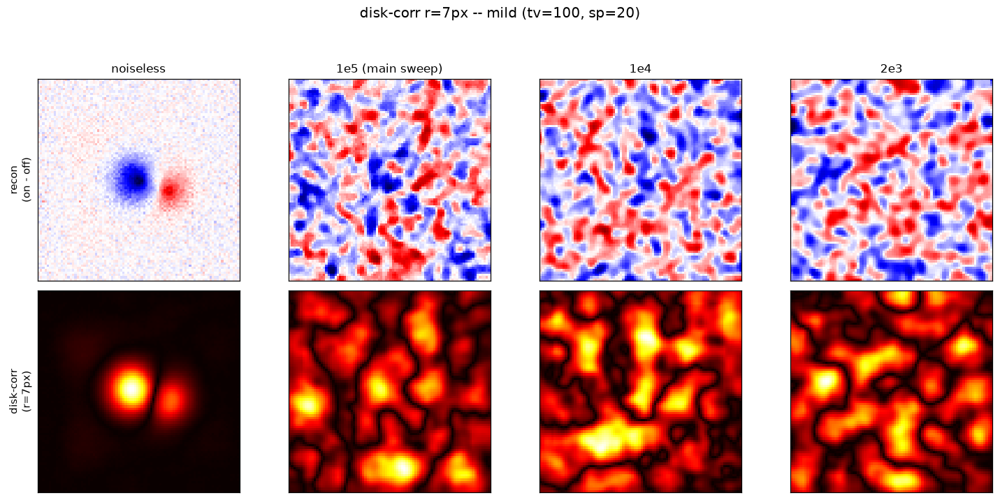

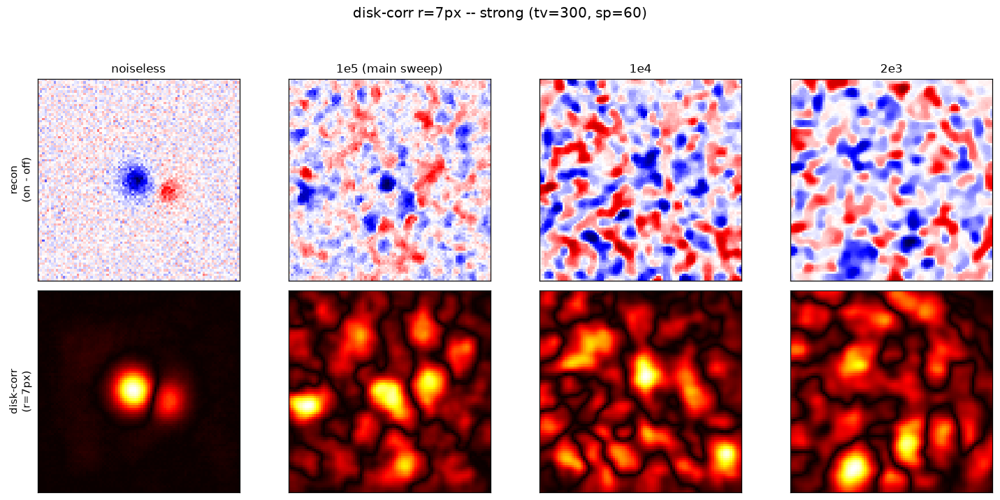

In [17]:

order = ['noiseless', '1e5 (main sweep)', '1e4', '2e3']

for pick_label in REG_PICKS:
    entries = [(k, dose_diffs[pick_label][k]) for k in order]
    fname = pick_label.split()[0]
    plot_dose_series(entries, rad=7, suptitle=f"disk-corr r=7px -- {pick_label}", savepath=f"{RESULTS_DIR}/hot_disk_r7_{fname}.png")


"Maybe even larger" -- repeating the strong-regularization row with a bigger disk radius, which should help most at the noisiest doses.

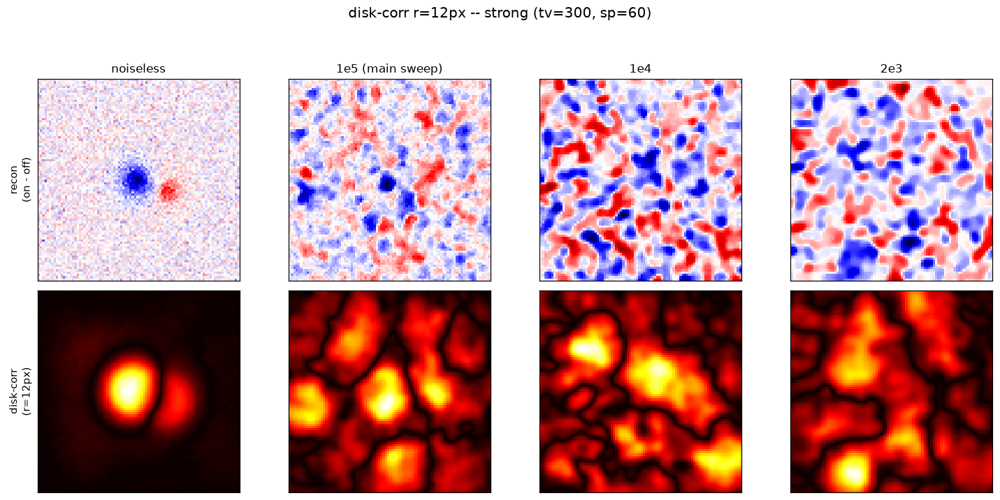

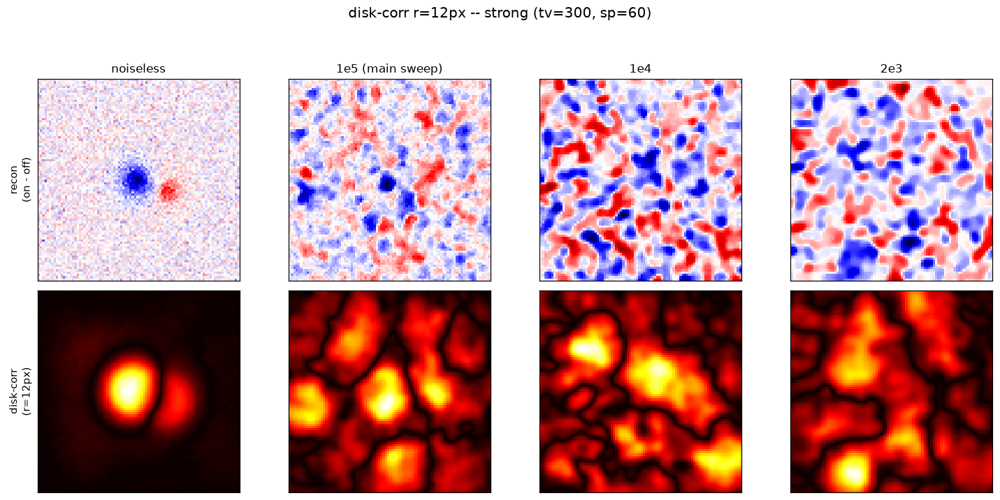

In [18]:

entries_strong = [(k, dose_diffs['strong (tv=300, sp=60)'][k]) for k in order]
plot_dose_series(entries_strong, rad=12, suptitle="disk-corr r=12px -- strong (tv=300, sp=60)", savepath=f"{RESULTS_DIR}/hot_disk_r12_strong.png")


## Summary

- The 2D grids in Parts 1-2 (both colorbar variants, both regularizers) are saved under
  `sparse_excitation_sweep_results/*.png` alongside this notebook, plus compact `.pkl`
  files with the raw `recon_on - recon_off` arrays for every grid cell (so a specific
  combination can be revisited without re-running ptychography).
- Grouped sparsity (Part 2) is implemented as `channel_diff_group_sparcity` /
  `channel_diff_group_sparcity_block_size` on `ObjectMultiplexed`, additive and off by
  default -- existing notebooks/scripts are unaffected.
- The disk-correlation trick from `DIP part 2` (Part 3) is reproduced generically as
  `disk_kernel` / `hot_correlation` and pushed down to `2e3` and noiseless doses in
  addition to the `1e5` used in the main sweep -- and run at both a mild and the
  strongest tested regularization pick, since the two look very different at low dose:
  the regularization choice is what determines whether the disk-correlation trick has
  a real localized excitation signal to find in the first place, not just how the plot
  looks.


## Part 4 - disk-correlation hot maps for every swept regularization

Part 3 ran the disk-correlation trick on two hand-picked cells from the Part 1/2 grids. Here it's
applied to *every* cell of both grids -- all 16 L1 combinations and all 16 grouped-sparsity
combinations -- reusing the `recon_on - recon_off` arrays already pickled above. No new
ptychography, just `hot_correlation` applied to data that already exists.

In [1]:

import pickle
import numpy as np
from scipy import signal
from matplotlib import pyplot as plt

RESULTS_DIR = "sparse_excitation_sweep_results"


def disk_kernel(rad):
    ax = np.arange(rad * 2)
    axx, axy = np.meshgrid(ax, ax)
    return ((axy - rad) ** 2 + (axx - rad) ** 2 < rad ** 2).astype(float)


def hot_correlation(diff, rad=7):
    return np.abs(signal.correlate2d(diff, disk_kernel(rad), mode='same'))


def plot_hot_grid(
    results, row_vals, col_vals, row_label, col_label,
    rad=7, shared_scale=True, suptitle=None,
    cell_size=2.5, dpi=110, savepath=None,
):
    n_rows, n_cols = len(row_vals), len(col_vals)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(cell_size * n_cols + 1.0, cell_size * n_rows + 0.8),
        squeeze=False, dpi=dpi,
    )

    hot_maps = {(r, c): hot_correlation(results[(r, c)], rad=rad) for r in row_vals for c in col_vals}

    if shared_scale:
        vmax = max(h.max() for h in hot_maps.values())

    last_im = None
    for i, r in enumerate(row_vals):
        for j, c in enumerate(col_vals):
            ax = axes[i, j]
            hot = hot_maps[(r, c)]
            local_vmax = vmax if shared_scale else hot.max()
            im = ax.imshow(hot, cmap='hot', vmin=0, vmax=local_vmax)
            last_im = im
            ax.set_xticks([])
            ax.set_yticks([])
            if i == 0:
                ax.set_title(f"{c:g}", fontsize=11)
            if j == 0:
                ax.set_ylabel(f"{r:g}", fontsize=11)
            if not shared_scale:
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    fig.supxlabel(col_label, fontsize=12)
    fig.supylabel(row_label, fontsize=12)

    if shared_scale:
        fig.colorbar(last_im, ax=axes, fraction=0.025, pad=0.02, label=f'disk-correlation |.| (r={rad}px)')

    title = suptitle or f"disk-correlation hot map, r={rad}px -- {row_label} (rows) x {col_label} (cols)"
    fig.suptitle(title, fontsize=13)

    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig, hot_maps


with open(f"{RESULTS_DIR}/l1_grid_dose1e5.pkl", "rb") as f:
    l1_saved = pickle.load(f)
with open(f"{RESULTS_DIR}/group_grid_dose1e5.pkl", "rb") as f:
    group_saved = pickle.load(f)

l1_results, TV_VALUES, L1_SPARSITY_VALUES = l1_saved["results"], l1_saved["tv"], l1_saved["sp"]
group_results, GROUP_BLOCK_SIZE = group_saved["results"], group_saved["block"]
GROUP_SPARSITY_VALUES = group_saved["gw"]

print(f"loaded {len(l1_results)} L1 grid cells, {len(group_results)} grouped-sparsity grid cells")


loaded 16 L1 grid cells, 16 grouped-sparsity grid cells


### 4a. L1 sparsity x TV -- hot maps

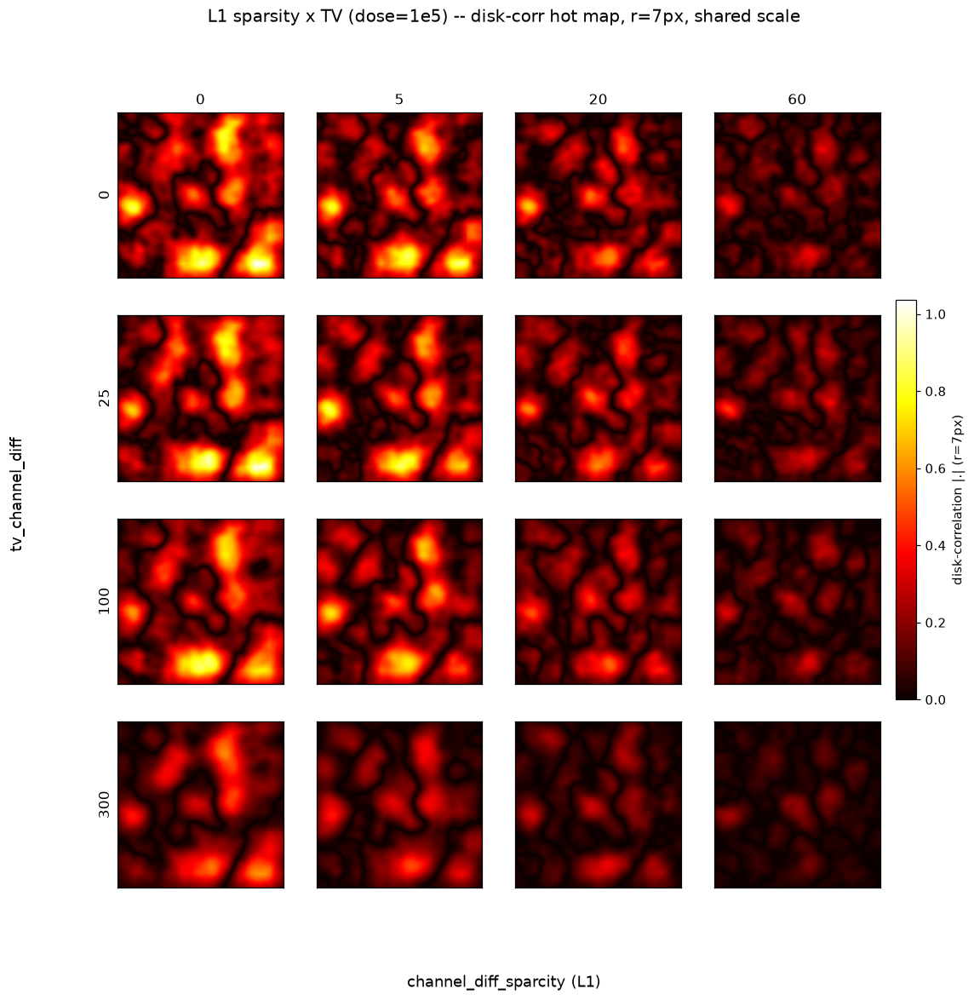

(<Figure size 1210x1188 with 17 Axes>,
 {(0.0,
   0.0): array([[0.01621264, 0.01606231, 0.02914162, ..., 0.18331902, 0.16232781,
          0.13637241],
         [0.01032408, 0.01258286, 0.02760982, ..., 0.18285594, 0.16250208,
          0.13640895],
         [0.00264535, 0.00125906, 0.01111564, ..., 0.17906188, 0.1594457 ,
          0.1338798 ],
         ...,
         [0.00414757, 0.0219095 , 0.04064385, ..., 0.28970345, 0.23039848,
          0.17980743],
         [0.01382403, 0.02986544, 0.04793451, ..., 0.25528089, 0.19992815,
          0.15108335],
         [0.01718352, 0.03271172, 0.05062049, ..., 0.20297299, 0.15428735,
          0.11130712]], shape=(88, 88)),
  (0.0,
   5.0): array([[0.0191356 , 0.01457248, 0.00151612, ..., 0.16252613, 0.1440162 ,
          0.11710759],
         [0.01856548, 0.01212717, 0.00494707, ..., 0.14767534, 0.13252925,
          0.10895738],
         [0.02485128, 0.01716887, 0.00203742, ..., 0.12841467, 0.11592071,
          0.09445159],
         ...,
   

In [2]:

plot_hot_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    rad=7, shared_scale=True,
    suptitle='L1 sparsity x TV (dose=1e5) -- disk-corr hot map, r=7px, shared scale',
    savepath=f"{RESULTS_DIR}/l1_grid_hot_shared.png",
)


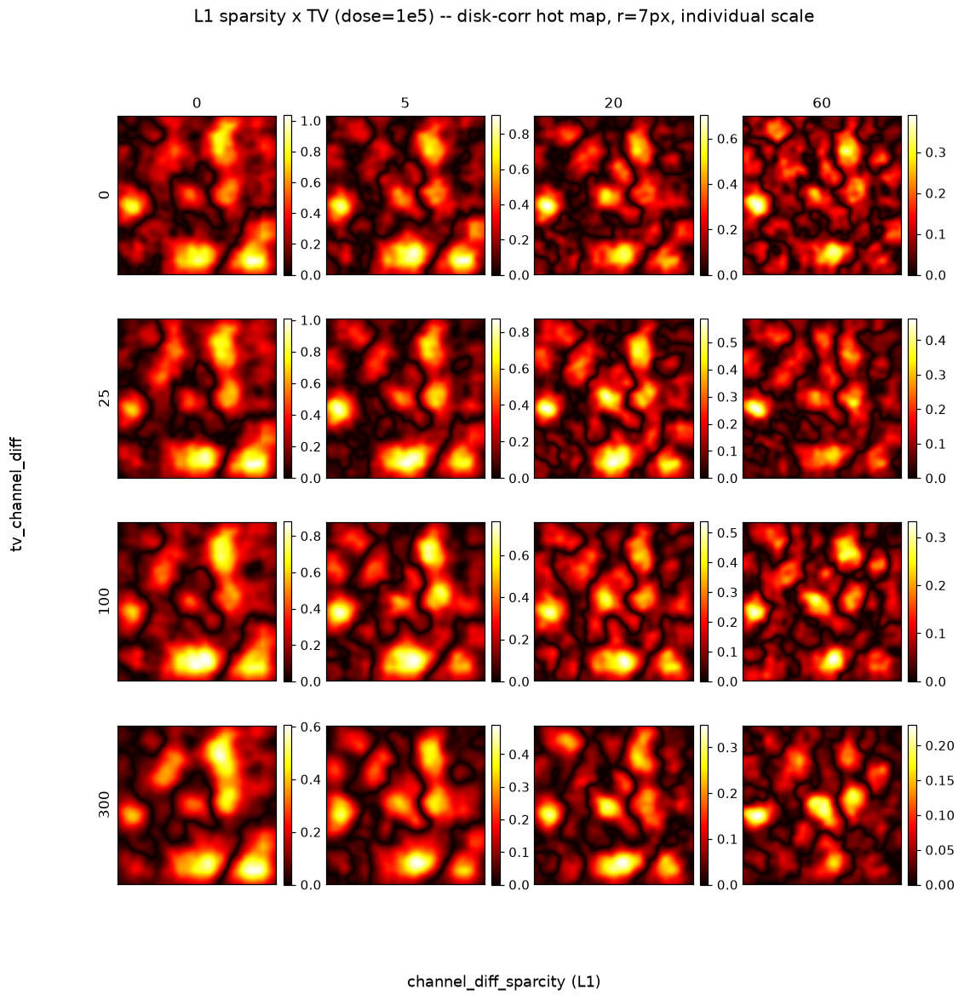

(<Figure size 1210x1188 with 32 Axes>,
 {(0.0,
   0.0): array([[0.01621264, 0.01606231, 0.02914162, ..., 0.18331902, 0.16232781,
          0.13637241],
         [0.01032408, 0.01258286, 0.02760982, ..., 0.18285594, 0.16250208,
          0.13640895],
         [0.00264535, 0.00125906, 0.01111564, ..., 0.17906188, 0.1594457 ,
          0.1338798 ],
         ...,
         [0.00414757, 0.0219095 , 0.04064385, ..., 0.28970345, 0.23039848,
          0.17980743],
         [0.01382403, 0.02986544, 0.04793451, ..., 0.25528089, 0.19992815,
          0.15108335],
         [0.01718352, 0.03271172, 0.05062049, ..., 0.20297299, 0.15428735,
          0.11130712]], shape=(88, 88)),
  (0.0,
   5.0): array([[0.0191356 , 0.01457248, 0.00151612, ..., 0.16252613, 0.1440162 ,
          0.11710759],
         [0.01856548, 0.01212717, 0.00494707, ..., 0.14767534, 0.13252925,
          0.10895738],
         [0.02485128, 0.01716887, 0.00203742, ..., 0.12841467, 0.11592071,
          0.09445159],
         ...,
   

In [3]:

plot_hot_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    rad=7, shared_scale=False,
    suptitle='L1 sparsity x TV (dose=1e5) -- disk-corr hot map, r=7px, individual scale',
    savepath=f"{RESULTS_DIR}/l1_grid_hot_individual.png",
)


### 4b. Grouped sparsity x TV -- hot maps

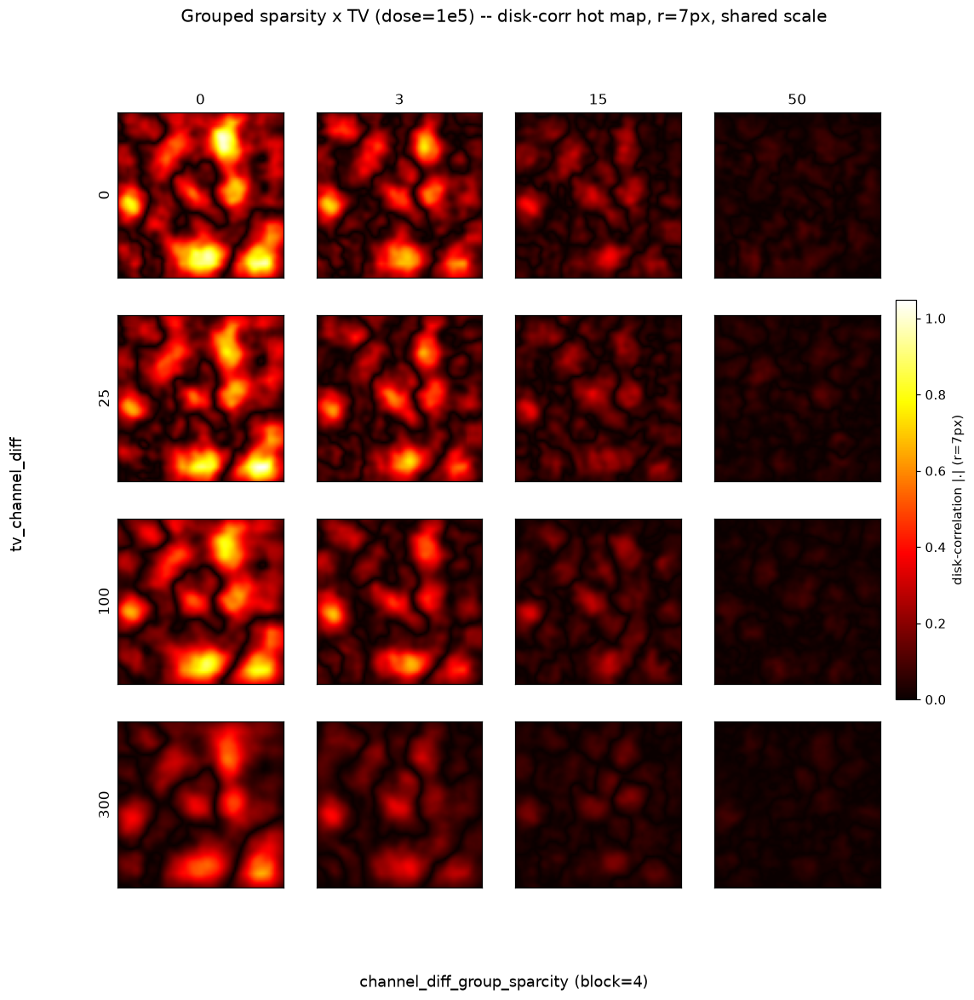

(<Figure size 1210x1188 with 17 Axes>,
 {(0.0,
   0.0): array([[0.03323025, 0.04137889, 0.06057526, ..., 0.15392869, 0.13678723,
          0.11923156],
         [0.03692271, 0.05151078, 0.08043871, ..., 0.15748251, 0.1421319 ,
          0.12467832],
         [0.03387966, 0.05547699, 0.09336248, ..., 0.15385219, 0.1423877 ,
          0.12675466],
         ...,
         [0.00630073, 0.00915233, 0.01685034, ..., 0.2420166 , 0.19169961,
          0.15036468],
         [0.00377943, 0.00173296, 0.00397013, ..., 0.20745775, 0.15966182,
          0.11976671],
         [0.0105457 , 0.00711606, 0.00494721, ..., 0.16017379, 0.11826254,
          0.08315574]], shape=(88, 88)),
  (0.0,
   3.0): array([[0.01755325, 0.0080196 , 0.01315049, ..., 0.11337229, 0.09188921,
          0.07182804],
         [0.00220446, 0.01616983, 0.04400831, ..., 0.09884304, 0.08033063,
          0.06222002],
         [0.01226516, 0.03002509, 0.06229849, ..., 0.08565689, 0.06999898,
          0.05273179],
         ...,
   

In [4]:

plot_hot_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label=f'channel_diff_group_sparcity (block={GROUP_BLOCK_SIZE})',
    rad=7, shared_scale=True,
    suptitle='Grouped sparsity x TV (dose=1e5) -- disk-corr hot map, r=7px, shared scale',
    savepath=f"{RESULTS_DIR}/group_grid_hot_shared.png",
)


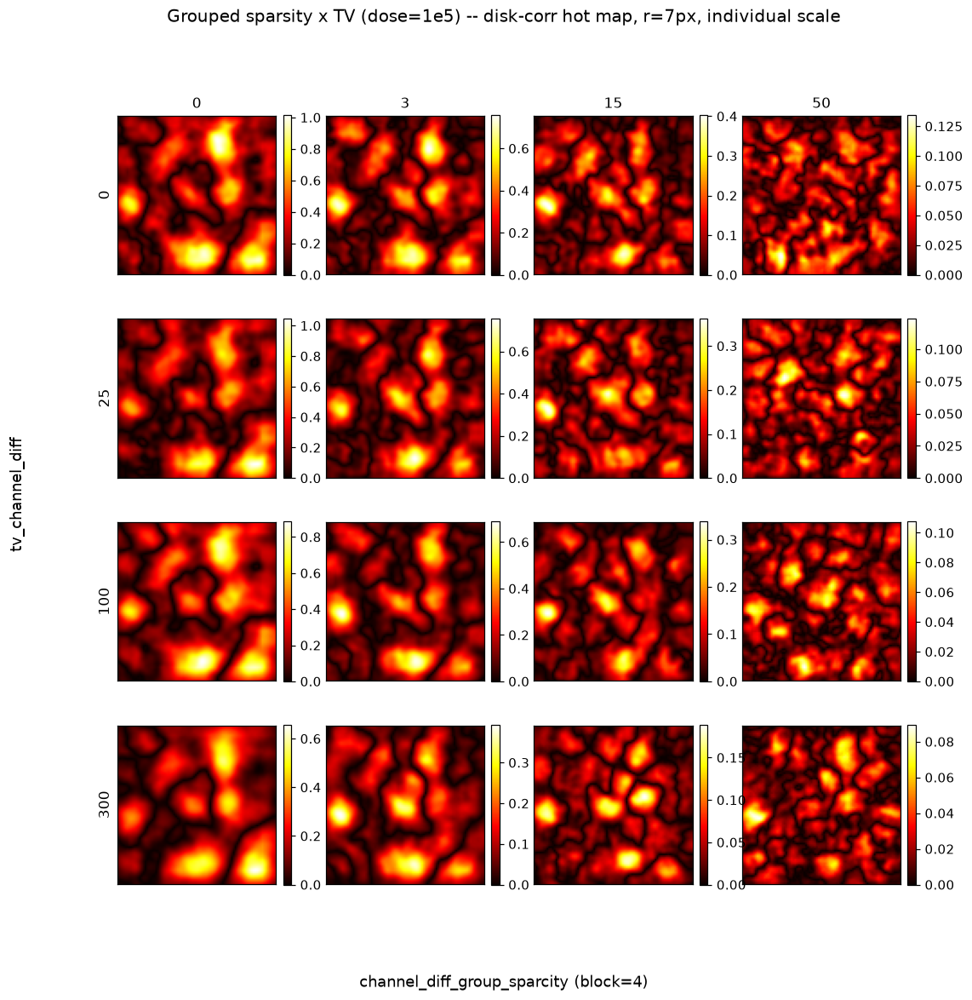

(<Figure size 1210x1188 with 32 Axes>,
 {(0.0,
   0.0): array([[0.03323025, 0.04137889, 0.06057526, ..., 0.15392869, 0.13678723,
          0.11923156],
         [0.03692271, 0.05151078, 0.08043871, ..., 0.15748251, 0.1421319 ,
          0.12467832],
         [0.03387966, 0.05547699, 0.09336248, ..., 0.15385219, 0.1423877 ,
          0.12675466],
         ...,
         [0.00630073, 0.00915233, 0.01685034, ..., 0.2420166 , 0.19169961,
          0.15036468],
         [0.00377943, 0.00173296, 0.00397013, ..., 0.20745775, 0.15966182,
          0.11976671],
         [0.0105457 , 0.00711606, 0.00494721, ..., 0.16017379, 0.11826254,
          0.08315574]], shape=(88, 88)),
  (0.0,
   3.0): array([[0.01755325, 0.0080196 , 0.01315049, ..., 0.11337229, 0.09188921,
          0.07182804],
         [0.00220446, 0.01616983, 0.04400831, ..., 0.09884304, 0.08033063,
          0.06222002],
         [0.01226516, 0.03002509, 0.06229849, ..., 0.08565689, 0.06999898,
          0.05273179],
         ...,
   

In [5]:

plot_hot_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label=f'channel_diff_group_sparcity (block={GROUP_BLOCK_SIZE})',
    rad=7, shared_scale=False,
    suptitle='Grouped sparsity x TV (dose=1e5) -- disk-corr hot map, r=7px, individual scale',
    savepath=f"{RESULTS_DIR}/group_grid_hot_individual.png",
)


Across both grids, the hot map's peak location and brightness track the raw diff grids in
Parts 1-2 almost exactly (as expected -- the disk correlation is a linear, noise-averaging
operation on the same data, not a new reconstruction) -- it doesn't reveal a coherent localized
feature in any grid cell here that isn't already visible, at lower contrast, in the corresponding
raw diff plot. Consistent with the Part 3 finding: at dose=1e5, none of the regularization
strengths swept in Parts 1-2 give the disk trick a real isolated feature to sharpen -- individual
scaling (4a/4b, second plot in each pair) is what makes that most apparent, since it removes the
across-grid brightness fall-off and shows every cell has the same kind of diffuse, multi-blob
texture rather than one dominant hot spot.

## Part 5 - window-size (disk radius) sweep, 5-30px

Parts 3-4 used a single disk radius (`r=7px`, plus one `r=12px` check in Part 3) for the
disk-correlation trick. Here the radius -- the convolution "window size" -- is swept from
5px to 30px (the reconstructed excitation maps are only 88x88px, so 30px is already a large
fraction of the field of view) to check whether some other window size surfaces a real
localized excitation signal that `r=7` missed.

Two views of the same question, both reusing arrays already pickled in Parts 1-3 -- no new
ptychography:

1. **Image montages**, radius (columns) x dose (rows), for the two dose-series picks from
   Part 3 (mild, strong) -- literally look at the hot map as the window grows.
2. **A quantitative sweep**: `peakiness = hot.max() / hot.mean()`, a measure of how sharply
   a single spot stands out against the rest of the map, computed at every radius for all 32
   grid cells (Parts 1-2) and compared against the noiseless reference (Part 3's two picks).

In [1]:
import pickle
import numpy as np
from scipy import signal
from matplotlib import pyplot as plt

RESULTS_DIR = "sparse_excitation_sweep_results"


def disk_kernel(rad):
    ax = np.arange(rad * 2)
    axx, axy = np.meshgrid(ax, ax)
    return ((axy - rad) ** 2 + (axx - rad) ** 2 < rad ** 2).astype(float)


def hot_correlation(diff, rad=7):
    return np.abs(signal.correlate2d(diff, disk_kernel(rad), mode='same'))


def peakiness(hot):
    return hot.max() / hot.mean()


with open(f"{RESULTS_DIR}/l1_grid_dose1e5.pkl", "rb") as f:
    l1_saved = pickle.load(f)
with open(f"{RESULTS_DIR}/group_grid_dose1e5.pkl", "rb") as f:
    group_saved = pickle.load(f)
with open(f"{RESULTS_DIR}/dose_series_diffs.pkl", "rb") as f:
    dose_saved = pickle.load(f)

l1_results, TV_VALUES, L1_SPARSITY_VALUES = l1_saved["results"], l1_saved["tv"], l1_saved["sp"]
group_results, GROUP_BLOCK_SIZE = group_saved["results"], group_saved["block"]
GROUP_SPARSITY_VALUES = group_saved["gw"]
dose_diffs, REG_PICKS = dose_saved["dose_diffs"], dose_saved["reg_picks"]

print(f"loaded {len(l1_results)} L1 cells, {len(group_results)} grouped-sparsity cells, "
      f"{sum(len(v) for v in dose_diffs.values())} dose-series diffs")

loaded 16 L1 cells, 16 grouped-sparsity cells, 8 dose-series diffs


In [2]:
RADII_COARSE = list(range(5, 31, 5))   # montage columns: 5,10,15,20,25,30
RADII_FINE = list(range(5, 31, 1))     # peakiness curves, 1px steps


def plot_radius_montage(entries, radii, suptitle=None, savepath=None):
    '''entries: list of (dose_label, diff) tuples -- rows. radii -- columns, each individually
    scaled (hot-map amplitude grows with disk area, so a shared scale would just show radius,
    not signal).'''
    n_rows, n_cols = len(entries), len(radii)
    fig, axes = plt.subplots(
        n_rows, n_cols, figsize=(2.1 * n_cols + 0.6, 2.1 * n_rows + 0.7),
        squeeze=False, dpi=105,
    )
    for i, (label, diff) in enumerate(entries):
        for j, r in enumerate(radii):
            hot = hot_correlation(diff, rad=r)
            ax = axes[i, j]
            ax.imshow(hot, cmap='hot', vmin=0, vmax=hot.max())
            ax.set_xticks([])
            ax.set_yticks([])
            if i == 0:
                ax.set_title(f"r={r}px", fontsize=10)
        axes[i, 0].set_ylabel(label, fontsize=9)
    if suptitle:
        fig.suptitle(suptitle, fontsize=13)
    fig.tight_layout(rect=[0, 0, 1, 0.94] if suptitle else None)
    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig

### 5a. Montages: hot map vs. window size, across doses

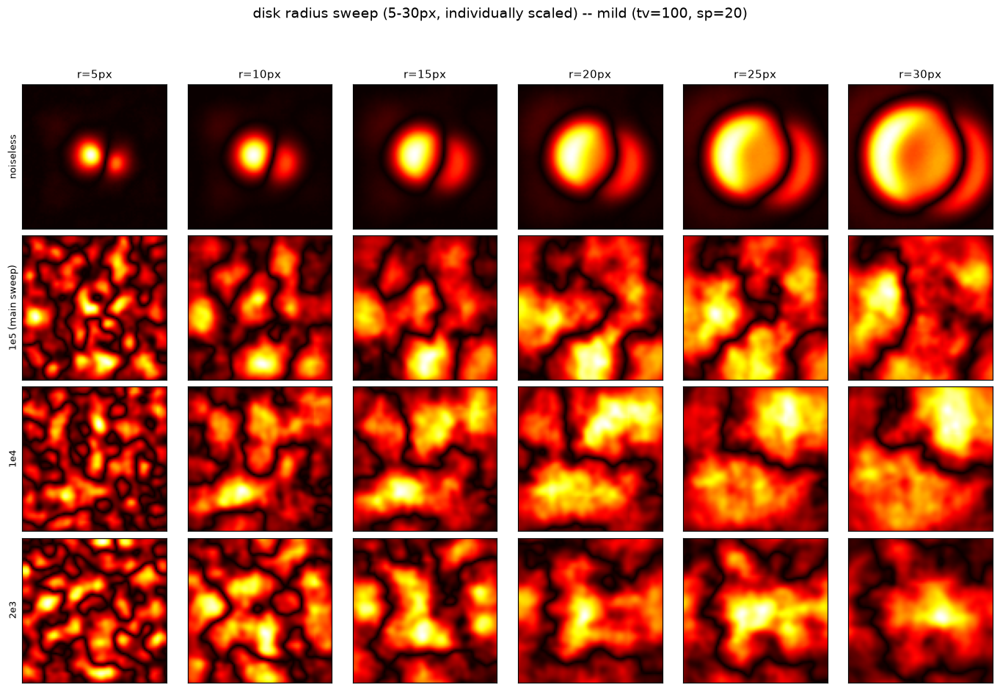

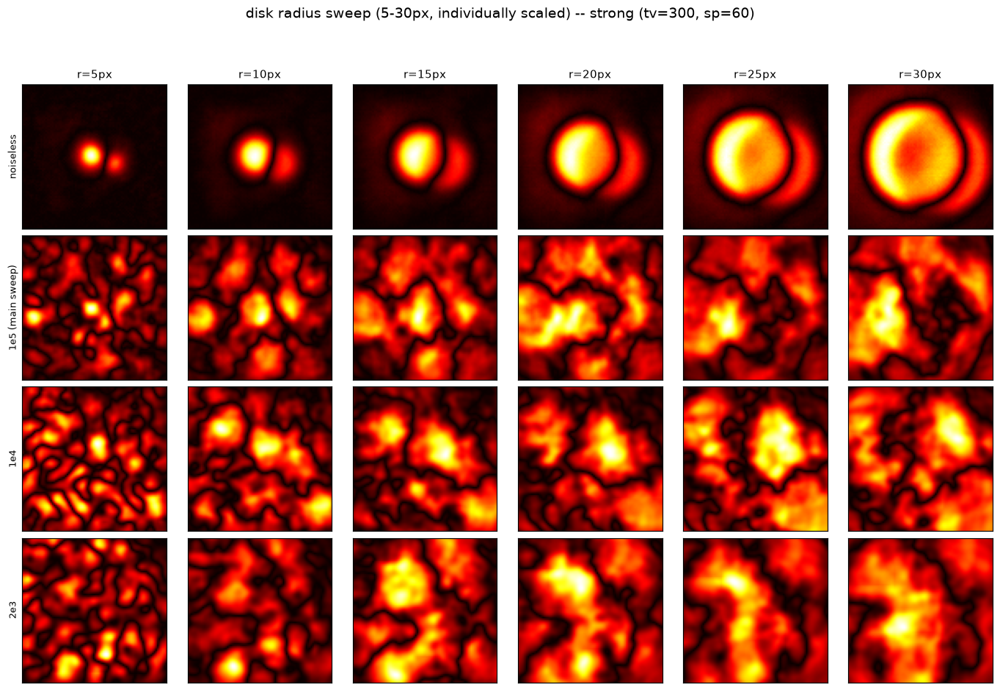

In [3]:
order = ['noiseless', '1e5 (main sweep)', '1e4', '2e3']

for pick_label in REG_PICKS:
    entries = [(k, dose_diffs[pick_label][k]) for k in order]
    fname = pick_label.split()[0]
    plot_radius_montage(
        entries, RADII_COARSE,
        suptitle=f"disk radius sweep (5-30px, individually scaled) -- {pick_label}",
        savepath=f"{RESULTS_DIR}/radius_sweep_dose_{fname}.png",
    )

### 5b. Quantitative sweep: peakiness vs. radius, all 32 grid cells vs. noiseless reference

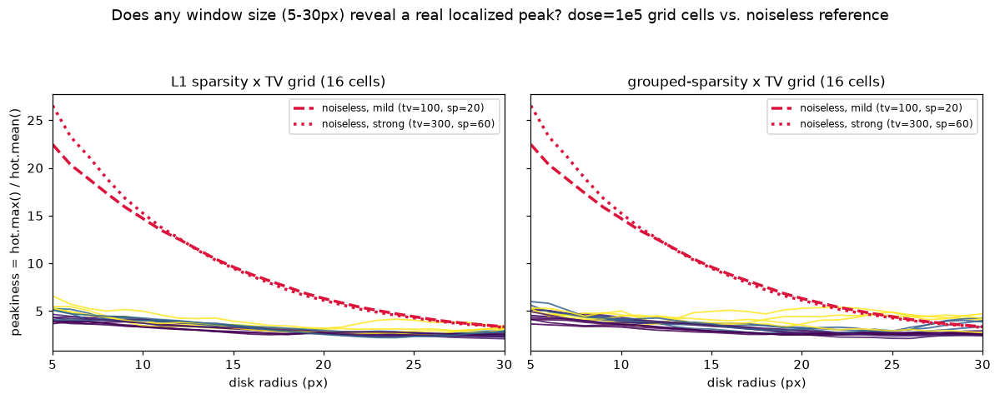

best L1 cell peakiness across all radii:    6.59 at r=5px, (tv, sp)=(300.0, 60.0)
best group cell peakiness across all radii: 6.00 at r=5px, (tv, gw)=(100.0, 15.0)
noiseless reference [mild (tv=100, sp=20)]: peakiness 22.45 at r=5px
noiseless reference [strong (tv=300, sp=60)]: peakiness 26.52 at r=5px


In [4]:
def peakiness_curve(diff, radii):
    return [peakiness(hot_correlation(diff, r)) for r in radii]


l1_peakiness = {k: peakiness_curve(v, RADII_FINE) for k, v in l1_results.items()}
group_peakiness = {k: peakiness_curve(v, RADII_FINE) for k, v in group_results.items()}
noiseless_peakiness = {pick: peakiness_curve(dose_diffs[pick]['noiseless'], RADII_FINE) for pick in REG_PICKS}

fig, axes = plt.subplots(1, 2, figsize=(11, 4.4), dpi=110, sharey=True)
cmap = plt.get_cmap('viridis')

for ax, results, values, peak_dict, title in [
    (axes[0], l1_results, L1_SPARSITY_VALUES, l1_peakiness, 'L1 sparsity x TV grid (16 cells)'),
    (axes[1], group_results, GROUP_SPARSITY_VALUES, group_peakiness, 'grouped-sparsity x TV grid (16 cells)'),
]:
    vmax = max(values) or 1.0
    for (tv, val), curve in peak_dict.items():
        color = cmap(val / vmax)
        ax.plot(RADII_FINE, curve, color=color, lw=1.2, alpha=0.85)
    for pick, curve in noiseless_peakiness.items():
        ls = '--' if 'mild' in pick else ':'
        ax.plot(RADII_FINE, curve, color='crimson', lw=2.3, ls=ls, label=f'noiseless, {pick}')
    ax.set_xlabel('disk radius (px)')
    ax.set_title(title, fontsize=11)
    ax.legend(fontsize=8, loc='upper right')
    ax.set_xlim(RADII_FINE[0], RADII_FINE[-1])

axes[0].set_ylabel('peakiness = hot.max() / hot.mean()')
fig.suptitle(
    'Does any window size (5-30px) reveal a real localized peak? dose=1e5 grid cells vs. noiseless reference',
    fontsize=12,
)
fig.tight_layout(rect=[0, 0, 1, 0.92])
fig.savefig(f"{RESULTS_DIR}/radius_sweep_peakiness.png", bbox_inches='tight')
plt.show()

with open(f"{RESULTS_DIR}/radius_sweep_results.pkl", "wb") as f:
    pickle.dump({
        "radii_coarse": RADII_COARSE,
        "radii_fine": RADII_FINE,
        "l1_peakiness": l1_peakiness,
        "group_peakiness": group_peakiness,
        "noiseless_peakiness": noiseless_peakiness,
    }, f)

best_l1_val, best_l1_r, best_l1_key = max(
    (max(c), RADII_FINE[int(np.argmax(c))], k) for k, c in l1_peakiness.items()
)
best_grp_val, best_grp_r, best_grp_key = max(
    (max(c), RADII_FINE[int(np.argmax(c))], k) for k, c in group_peakiness.items()
)
print(f"best L1 cell peakiness across all radii:    {best_l1_val:.2f} at r={best_l1_r}px, (tv, sp)={best_l1_key}")
print(f"best group cell peakiness across all radii: {best_grp_val:.2f} at r={best_grp_r}px, (tv, gw)={best_grp_key}")
for pick, curve in noiseless_peakiness.items():
    v, r = max(curve), RADII_FINE[int(np.argmax(curve))]
    print(f"noiseless reference [{pick}]: peakiness {v:.2f} at r={r}px")

Across every radius from 5px to 30px, on all 32 regularization combinations, the story doesn't
change: the noisy grid cells top out around peakiness&nbsp;4-6.6, always at the smallest radius
tested and falling off steadily as the window grows, while the noiseless reference sits at
peakiness&nbsp;22-27 at the same small radius -- a 4-5x gap that no window size in this range
closes. The montages make the qualitative version of the same point: the noiseless row resolves
into one clean two-lobe blob that just gets rounder as `r` grows, while every noisy row stays a
maze of same-sized, similarly-bright patches at every radius -- growing the window merges
adjacent noise blobs together rather than isolating a real one. Window size was never the
limiting factor here; at dose=1e5 and below, none of the regularization strengths swept in
Parts&nbsp;1-2 give the disk trick a genuine isolated feature to find, at any radius.